## Introduction
In this part2 of our Human Emotion Classifier Mini Project, we will look at augmenting and cleaning our data that is used for training our model.
This article will be an extension of the previous [part1 of Human Emotion Classifier](projects/miniprojects/MiniProject_Happy_Sad_Classifier/). Like in the previous project, this python implementation will be based on fastai library.

## STEP1: Setup
Before we proceed with augmenting & cleaning data, lets setup this notebook by downloading some test data for our Happy Sad classifier and setting up the model.

In this step we will be installing required packages and downloading images to our colab workspace. Feel free to review my [previous post](projects/miniprojects/MiniProject_Happy_Sad_Classifier/) for explanation of the below code.

In [ ]:
# `!pip install -Uqq <libraries>` upgrades to the latest version of <libraries>
!pip install -Uqq fastai duckduckgo_search

In [ ]:
from duckduckgo_search import ddg_images
from fastcore.all import *

def search_images(term, max_images=30):
    print(f"Searching for '{term}'")
    return L(ddg_images(term, max_results=max_images)).itemgot('image')

Test run for a single image search using ddg.

In [ ]:
#NB: `search_images` depends on duckduckgo.com, which doesn't always return correct responses.
#    If you get a JSON error, just try running it again (it may take a couple of tries).
urls = search_images('happy human face', max_images=1)
urls[0]

Searching for 'happy human face'


/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:60: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")
/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:64: UserWarning: parameter page is deprecated
  warnings.warn("parameter page is deprecated")
/usr/local/lib/python3.10/dist-packages/duckduckgo_search/compat.py:66: UserWarning: parameter max_results is deprecated
  warnings.warn("parameter max_results is deprecated")


'https://i.pinimg.com/736x/08/15/db/0815db06df850e27e74411a3232ffa3e--smiling-eyes-heart-face.jpg'

Download the image URL and save to colab, and open using PIL.

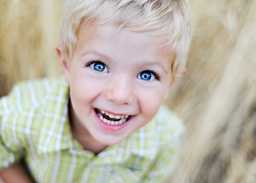

In [ ]:
from fastdownload import download_url
dest = 'happy.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

Great, our test script for searching and downloading images works fine.
Now lets make a new directory and download images.

In [ ]:
face_types = 'happy','sad', 'angry'
path = Path('faces')

In [ ]:
from time import sleep

if not path.exists():
    path.mkdir()
    for o in face_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        download_images(dest, urls=search_images(f'{o} human face + front view', max_images=100))
        sleep(5)
        download_images(dest, urls=search_images(f'{o} face + front view', max_images=100))
        sleep(5)
        download_images(dest, urls=search_images(f'{o} person face + front closeup', max_images=100))



Searching for 'happy human face + front view'
Searching for 'happy face + front view'
Searching for 'happy person face + front closeup'
Searching for 'sad human face + front view'
Searching for 'sad face + front view'
Searching for 'sad person face + front closeup'
Searching for 'angry human face + front view'
Searching for 'angry face + front view'
Searching for 'angry person face + front closeup'


You can delete the folder if you want to do a fresh download.

In [ ]:
#path.delete()

Lets check the number of files downloaded to each category:

In [ ]:
# Specify the directory path
foldername = "faces"  # Replace with the actual path

# Function to count files in a directory
def count_files_in_directory(directory):
    return len([f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))])

# Loop through each subdirectory
for o in face_types:
    subdirectory = os.path.join(foldername, o)
    num_files = count_files_in_directory(subdirectory)
    print(f"Number of files in '{o}' subdirectory: {num_files}")

Number of files in 'happy' subdirectory: 265
Number of files in 'sad' subdirectory: 264
Number of files in 'angry' subdirectory: 261


Quick check if our path has images

In [ ]:
fns = get_image_files(path)
fns

(#787) [Path('faces/happy/803d9ef1-d50b-4bd8-963f-69e58b4cd496.jpg'),Path('faces/happy/f1eb73df-5b2d-4c30-b914-d60281101972.jpg'),Path('faces/happy/195b79ea-4577-4cb5-8957-21e35ad82791.jpg'),Path('faces/happy/46d5a029-e0e4-4ee1-ae46-c59ad04d14fb.jpg'),Path('faces/happy/5aaa2350-4c9c-4e1e-8f94-5e66cb6eb618.jpg'),Path('faces/happy/c0d0e7be-43c6-44c3-8ea5-dc00cc64eac7.jpg'),Path('faces/happy/9a3ea967-9955-4a6a-a504-b850d9393419.jpg'),Path('faces/happy/9eebd409-3bf2-423b-89d5-fe3e2608c457.jpg'),Path('faces/happy/0624746c-e5d8-470f-bb2a-2fecd7e3bd6d.jpg'),Path('faces/happy/801068e3-a8c6-4d53-a254-10f02f60267d.jpg')...]

Some of our downloaded images might be corrupt too. We can check for failed images using  fastai's `verify_images` function.

In [ ]:
failed = verify_images(fns)
failed

(#18) [Path('faces/happy/40db1e96-dc45-488f-b73e-c04c976d3a54.jpg'),Path('faces/happy/2d2b4b70-89ce-4df1-8a03-2954d2f2fd33.png'),Path('faces/happy/e4f8cea9-6733-4d97-9ff2-acc25e366030.jpg'),Path('faces/happy/0238f319-85ce-431c-b165-cae404e9f0f9.jpg'),Path('faces/happy/8a37e7fd-0ea8-4d60-b9de-211be7f45177.svg'),Path('faces/happy/cf6a3985-bbf8-490a-bc38-54c5c89136cb.svg'),Path('faces/happy/32671e2c-aea5-42f2-a1d8-f68bf2d3896a.svg'),Path('faces/happy/cad5597a-258d-4e70-af39-768ba4da7158.jpg'),Path('faces/angry/ba2932e9-fa89-4409-b6ca-a243c79b7d58.jpg'),Path('faces/angry/e55b132a-a074-4ed5-9d3c-36c96506bf00.jpg')...]

We can delete (or remove) the failed images by running the unlink method.

Like most fastai functions that return a collection, verify_images returns an object of type L, which includes the map method. This calls the passed function on each element of the collection:

In [ ]:
failed.map(Path.unlink);

Note: You can use ??verify_images to lookup function information.

We have now completed step#1 of downloading images for training our model. We will now move on to the next step on how we can setup fastai dataloader function to feed these images into our model.

## STEP2: Loading Images into Model

We will be using fastai's `DataLoaders` class which will help us load the images into the model. It will also help us split the model into train and validation set.

To turn our downloaded data into a DataLoaders object we need to tell fastai at least four things:

- What kinds of data we are working with
- How to get the list of items
- How to label these items
- How to create the validation set

In [ ]:
faces = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

There are lots of things going on in this one block of code. Let me break down for you:
- first we provide a tuple where we specify what types we want for the independent and dependent variables: `blocks=(ImageBlock, CategoryBlock)`
- The get_image_files function takes a path, and returns a list of all of the images in that path (recursively, by default): `get_items=get_image_files`
-  randomly split 20% of the data
 as validation set `splitter=RandomSplitter(valid_pct=0.2, seed=42)`
- `get_y=parent_label`, parent_label is a function provided by fastai that simply gets the name of the folder a file is in.
- `item_tfms=Resize(128)` here we are specificing 'resize to 128 pixels' as the item transformation. More on this coming below.

Note: The independent variable (x) is the thing we are using to make predictions from, and the dependent variable (y) is our target.

With the above 'faces' variable, we have created a **template** class for creating a DataLoaders. We can now instantiate a new instance of the dataloaders by specifying the path input.

In [ ]:
dls = faces.dataloaders(path)

* A DataLoaders includes validation and training DataLoaders.
* DataLoader is a class that provides batches of a few items at a time to the GPU.
* When you loop through a DataLoader fastai will give you 64 (by default) items at a time, all stacked up into a single tensor. We can take a look at a few of those items by calling the show_batch method on a DataLoader:

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


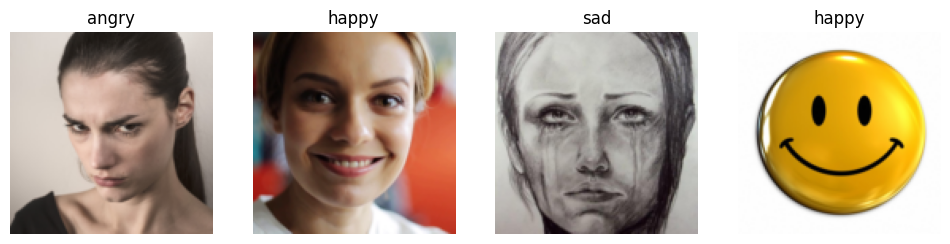

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

### Item Transformations:


**Why need a transform?**

Our images are all different sizes, and this is a problem for deep learning: we don't feed the model one image at a time but several of them (what we call a mini-batch). To group them in a big array (usually called a tensor) that is going to go through our model, they all need to be of the same size. So, we need to add a transform which will resize these images to the same size.

The following are some of the transforms:

- resize - crops the images to fit a square shape of the size requested. This can result in losing some important details. This is the default as seen above.


- Squish - squish or stretch the images, but they end up as unrealistic shapes, leading to a model that learns that things look different to how they actually are, which we would expect to result in lower accuracy

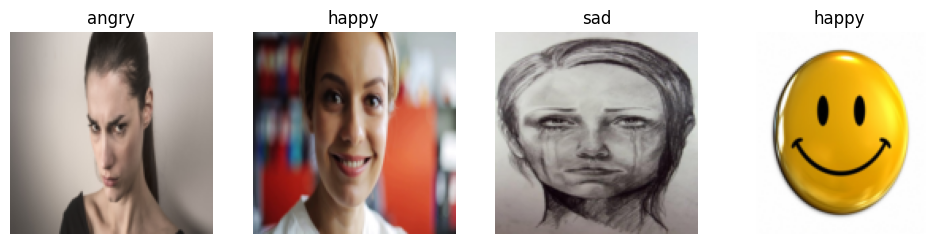

In [ ]:
faces = faces.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = faces.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

- Padding - If we pad the images then we have a whole lot of empty space, which is just wasted computation for our model and results in a lower effective resolution for the part of the image we actually use.

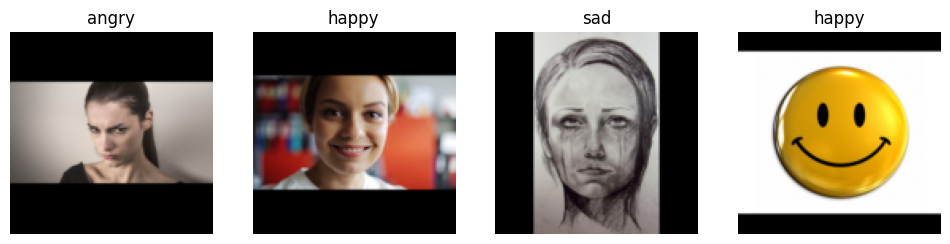

In [ ]:
faces = faces.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = faces.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

However, given these resize techniques, none of these seem useful. Croping may leave out important information. Squishing may cause pictures to appear weird. Padding just adds additional computational time.

**Is there any better resize technique?**

Yes! Introducing the '**random resize crop**' technique as our savior - Randomly select part of the image, and crop to just that part.
- On each epoch (which is one complete pass through all of our images in the dataset) we randomly select a different part of each image.
- This means that our model can learn to focus on, and recognize, different features in our images.
- It also reflects how images work in the real world: different photos of the same thing may be framed in slightly different ways.



- `min_scale` determines how much of the image to select at minimum each time. In our code, we say to select atleast 30% of our image each time a random crop happens. we dont want to go smaller than that.



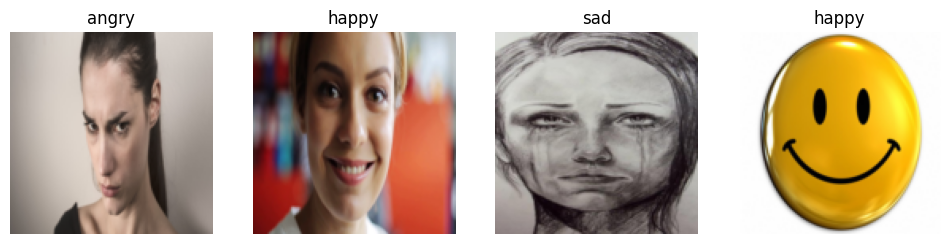

In [ ]:
faces = faces.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = faces.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1, unique=False)

This is the end of step#2. To recap:
- Our goal was to create a way to feed our downloaded images into our model. We determined definig a `Dataloaders` class is the way to achieve that.
- We also ran into a problem of making the images into equal size and our solution was to use random resize crop.

In the next step we can see how we can use this same function to 'augment' our data.

## STEP3: Data Augmentation

Data augmentation refers to creating random variations of our input data, such that they appear different, but do not actually change the meaning of the data.

In our previous implementation of Random Resize Cropping, you must have noticed the `unique=False` setting. We are telling to NOT have the same image repeated during RandomResizedCrop transform. However, if we set `unique=True` we can generate multiple random crops of the same image - thus 'augmenting' our dataset.

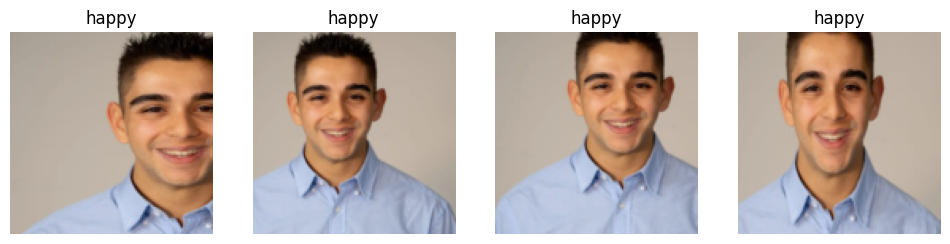

In [ ]:
faces = faces.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = faces.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)


Other common data augmentation techniques for images are rotation, flipping, perspective warping, brightness changes and contrast changes.

Because our images are now all the same size, we can apply these augmentations to an entire batch of them using the GPU, which will save a lot of time. To tell fastai we want to use these transforms on a batch, we use the `batch_tfms` parameter.

Note: RandomResizedCrop is NOT used in this example, so you can see the differences more clearly; The amount of augmentation is also doubled compared to the default, for the same reason.



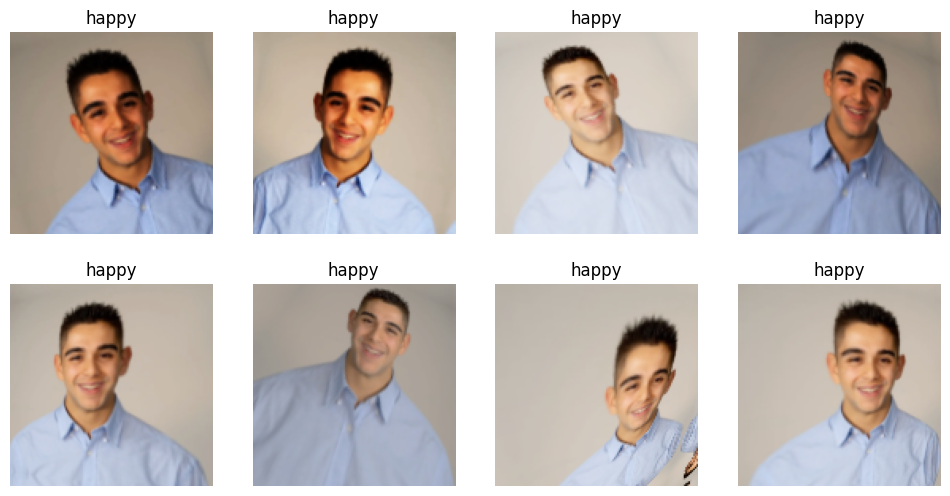

In [ ]:
faces = faces.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = faces.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)


Personally, am not new to Data Augmentation. In fact, my [final project](/projects/) during my Deep Learning semester at Georgia Tech was in the field of Semi-Supervised Learning (SSL) which uses similar techniques to increase your training data if you are short on labelled data.

Well, thats the quick intro to step#3, data augmentation. To recap, we have:
- made use of batch transform through GPU since all our images are now of equal size after resizing.
- Used random augmentation techniques with random cropping to augment or increase our dataset size.

## STEP4: Data Cleaning

Before we clean our data, we would run our collected data against our model.

**Why do we train our model before training it?**
Imagine cleaning our data directly. On what basis do we tell a good sample from a bad sample? If we train our model, we would get output prediction probability.
From this we will know which images are causing poor performance and we can selectly remove those data.

**Model Driven DataCleaning:**

In order to train our model, we prepare our `Dataloaders` template class for feeding our data into our model.

In [ ]:
faces = faces.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = faces.dataloaders(path)

In the above code:
- we standardize our image sizes to 224p using `RandomResizedCrop`
- Finally we also apply `aug_transforms` to augment our exisitng data - this is required since we downloaded only 150 images per class.

We can now feed this data into our model and run it.

In [ ]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.937506,1.181332,0.483660,00:19


epoch,train_loss,valid_loss,error_rate,time
0,1.322784,0.963943,0.405229,00:20
1,1.150738,0.952749,0.320261,00:20
2,0.962727,0.861842,0.254902,00:19
3,0.869386,0.816627,0.254902,00:21


**Confusion Matrix:**
Now that we have trained our model, we need to see where exactly our model is making mistakes. *Confusion Matrix* comes to our rescue.

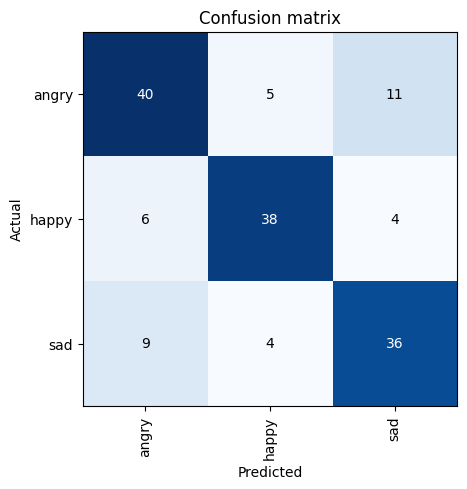

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

The labels in confusion matrix make it easy to interpret it. The rows represent the actual labels and the columns represent the predicted labels. Ideally we would want all the numbers to fall along diagonal; That way, the predicted labels matches the actual labels.

However in this case, it appears the model is able to perform really well(14/16=87.5%) on "Angry" faces😠, Somewhat well(9/18=50%) on Happy faces😀 and moderately well(7/16=43.75%) on "sad" faces😞.

**Determining reason for errors:**

We have blindly fed the data into our model and expecting it to perform well. We donot know for sure if the errors are due to model, bad image sample(outliers) or even wrong labels.

To introspect into this, lets pull down the images and rank them in order of their losses. The loss is a number that is higher if the model is incorrect (especially if it's also confident of its incorrect answer), or if it's correct, but not confident of its correct answer.

In fastai, `plot_top_losses` shows us the images with the highest loss in our dataset. As the title of the output says, each image is labeled with four things: prediction, actual (target label), loss, and probability. The probability here is the confidence level, from zero to one, that the model has assigned to its prediction:



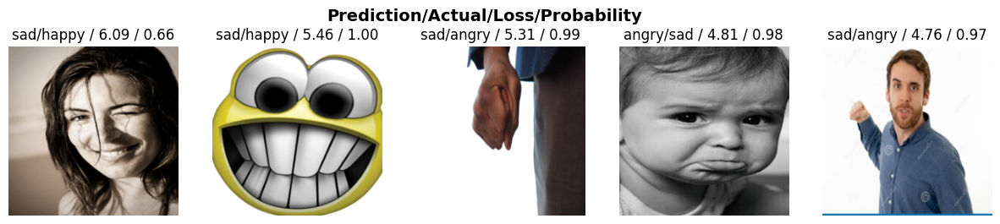

In [ ]:
interp.plot_top_losses(5, nrows=1)

As we can see from the output, it is pretty clear the happy faces are being continuously being recognized as angry.

Intuitively, we are used to think data cleaning first, model training next. However, this example shows, a model can infact help highlight the data issues quickly.

**Data Cleaning:**

fastai already has a nice method with builtin GUI called `ImageClassifierCleaner` that helps us with the datacleaning process. In this class, we first choose the category, then select the dataset (train or validation) and then view the images in descending order of loss. Finally, for datacleaning, we can use the UI to remove a sample or relabel a sample.

In [ ]:
#hide_output
from fastai.vision.widgets import *
cleaner = ImageClassifierCleaner(learn)
cleaner

Looking at the `happy` train dataset, we can see its not all smiley faces. Some expressions are surprised, some are cartoon & hand-drawn. (Side Note: Hand-drawn, cartoon and real pictures are considered different realms in CNNs). We can quickly use the UI to either delete the surprised face or move the crying face to the `sad` class.

ImageClassifierCleaner doesn't actually do the deleting or changing of labels for you; it just returns the indices of items to change. So, for instance, to delete (unlink) all images selected for deletion, we would run:

`for idx in cleaner.delete(): cleaner.fns[idx].unlink()`
To move images for which we've selected a different category, we would run:

`for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)`

**NOTE:** We need to run this code every time a new dropdown is selected. When a new dropdown is selected, the. buffer in cleaner.delete() & cleaner.change() is reset.

In [ ]:
cleaner.delete()

(#15) [0,1,2,3,4,8,12,13,15,17...]

In [ ]:
cleaner.change()

(#0) []

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)


We have now cleaned the data, lets retrain the model with the new cleaned data in the faces folder. We can redo all the steps from the beginning.

In [ ]:
path = Path('faces')
fns = get_image_files(path)
fns

(#677) [Path('faces/happy/803d9ef1-d50b-4bd8-963f-69e58b4cd496.jpg'),Path('faces/happy/f1eb73df-5b2d-4c30-b914-d60281101972.jpg'),Path('faces/happy/195b79ea-4577-4cb5-8957-21e35ad82791.jpg'),Path('faces/happy/46d5a029-e0e4-4ee1-ae46-c59ad04d14fb.jpg'),Path('faces/happy/c0d0e7be-43c6-44c3-8ea5-dc00cc64eac7.jpg'),Path('faces/happy/9a3ea967-9955-4a6a-a504-b850d9393419.jpg'),Path('faces/happy/9eebd409-3bf2-423b-89d5-fe3e2608c457.jpg'),Path('faces/happy/0624746c-e5d8-470f-bb2a-2fecd7e3bd6d.jpg'),Path('faces/happy/801068e3-a8c6-4d53-a254-10f02f60267d.jpg'),Path('faces/happy/da2b5d89-46a8-4c3e-9d87-0d5453906da4.png')...]

In [ ]:
failed = verify_images(fns)
failed

(#0) []

In [ ]:
failed.map(Path.unlink);

In [ ]:
faces = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
faces = faces.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = faces.dataloaders(path)

In [ ]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.948587,1.226522,0.481481,00:20


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,1.349108,0.997914,0.407407,00:17
1,1.117022,0.954740,0.325926,00:17
2,0.935056,0.957761,0.333333,00:16
3,0.828097,0.948619,0.325926,00:16


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes sh

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


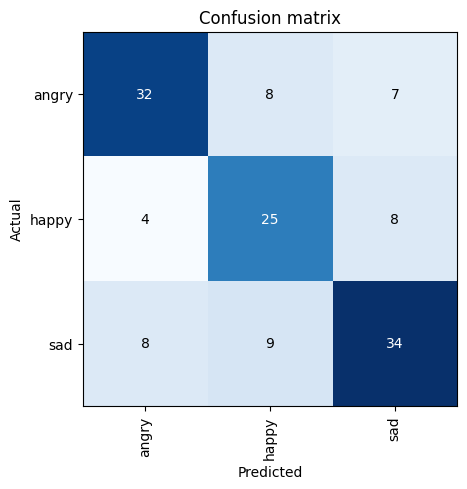

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Looking at the confusing matrix, our classifier is doing pretty well. Lets see where our top losses are:

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


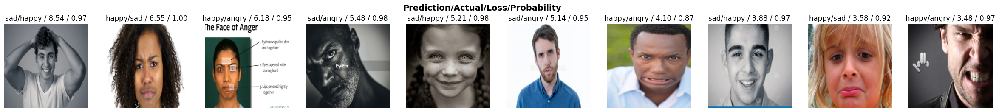

In [ ]:
interp.plot_top_losses(10, nrows=1)

From these top losses, we can understand that these appear to be abnormal outliers (atleast some of them do seem like it). Our classifier is not the greatest, but it should be good enough for detection of basic human emotions.

## STEP5: Pickling our Trained Model

Now that our model is trainined and optimized with datacleaning, we want to save its state, export it as a file and use it when we deploy it.

Recap that a model is an architecture with trained weights and biases. By exporting the trained model, we can save its architecture and the trained weights. The `export` method in fastai also saves the definition of our Dataloaders tempalte.

Calling `export`, fastai will save a file called "export.pkl":

In [ ]:
learn.export()

Confirming if our current path has a file ending with `.pkl`.

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

Great, we have now exported our trained model. All we need is this pickle file and we can use it directly to make predictions (aka Inference).

Lets go through the steps of using this pickle file:

In [ ]:
learn_inf = load_learner(path/'export.pkl')

Now that the learner is loaded from the pickle file, lets use it for predictions.

In [ ]:
prediction_results = learn_inf.predict(path/'happy.jpg')

prediction_results

('happy', tensor(1), tensor([2.5756e-03, 9.9692e-01, 5.0282e-04]))

This has returned three things: the predicted category in the same format you originally provided (in this case that's a string), the index of the predicted category, and the probabilities of each category. The last two are based on the order of categories in the vocab of the DataLoaders; that is, the stored list of all possible categories. At inference time, you can access the DataLoaders as an attribute of the Learner:



In [ ]:
learn_inf.dls.vocab

['angry', 'happy', 'sad']

We can use the index returned by prediction results to return the class and class probability.

In [ ]:
result_index = prediction_results[1]
print('predicted category:{}'.format(learn_inf.dls.vocab[result_index]))
print('predicted probability:{}'.format(prediction_results[2][result_index]))

predicted category:happy
predicted probability:0.9969214797019958
